In [1]:
using ComputationalHeatTransfer
using LaTeXStrings
using Revise
using LinearAlgebra
using DifferentialEquations
using Interpolations
using JLD2
using Plots
pyplot()  

cd(dirname(pwd()))
cd("src") 
includet("OneDOHP.jl")
using ..OneDOHP

┌ Warning: no Manifest.toml file found, static paths used
└ @ Revise C:\Users\liyux\.julia\packages\Revise\1boD5\src\packagedef.jl:1369


## turned on boiling, plate thickness=1mm, Hliquid = Hvapor = 1/100 original

# the plate code initialization

### Physical parameters

In [2]:
ρ = 2700;
c = 8.97e02;
k = 1.67e02;
# d = 2e-3;
d = 1e-3;
params = HeatConductionParameters(ρ,c,k,thickness=d)

HeatConductionParameters(2700.0, 897.0, 167.0, 6.895412692514142e-5, 0.001)

### Geometry parameters

In [3]:
inch = 2.54e-2;
Lx = 0.1524;
Ly = 0.0648;

In [4]:
xlim = (-Lx/2,Lx/2) .*1.0
ylim = (-Ly/2,Ly/2) .*1.0
Δx, Δt = setstepsizes(params.α,gridPe=8.0,fourier=0.3)


(0.0005516330154011314, 0.001323919236962715)

### Set up the evaporator and condenser

In [5]:
eb1 = Rectangle(0.5inch,1.0inch,1.5*Δx)
Te = RigidTransform((0.7inch,-0.0),0.0)
Te(eb1)

eb2 = Rectangle(0.5inch,1.0inch,1.5*Δx)
Te = RigidTransform((-0.7inch,-0.0),0.0)
Te(eb2)

cb1 = Rectangle(0.5inch*0.9,Ly*0.9/2,1.5*Δx)
Tc = RigidTransform((-2.5inch,-0.0),0.0)
Tc(cb1)

cb2 = Rectangle(0.5inch*0.9,Ly*0.9/2,1.5*Δx)
Tc = RigidTransform((2.5inch,-0.0),0.0)
Tc(cb2)

qe = 15500.0
hc = 1500.0
Tc = 0.0

eparams1 = PrescribedHeatFluxRegion(qe,eb1);
eparams2 = PrescribedHeatFluxRegion(qe,eb2);
cparams1 = PrescribedHeatModelRegion(hc,Tc,cb1);
cparams2 = PrescribedHeatModelRegion(hc,Tc,cb2);

### Set up the OHP

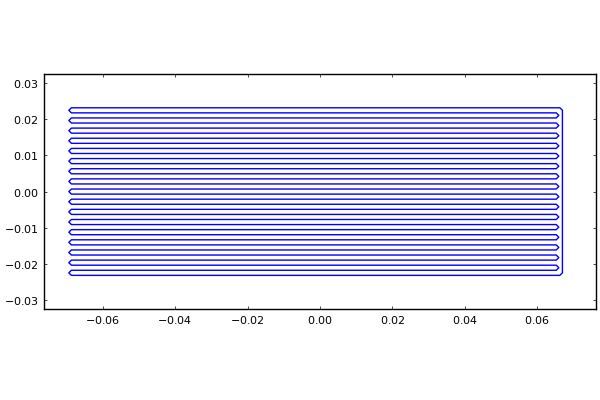

In [6]:
ds = 1.5Δx
nturn = 16
#pitch = 0.125
length_ohp = 46.25*1e-3
height = 133.83*1e-3
gap = d
pitch = length_ohp/(2*nturn+1)
x0, y0 = height/2, length_ohp/2
x, y, xf, yf = ComputationalHeatTransfer.construct_ohp_curve(nturn,pitch,height,gap,ds,x0,y0,false,false,3pi/2)
ohp = BasicBody(x,y)

plot(ohp,fillalpha=0,linecolor=:blue,xlims=xlim,ylims=ylim,framestyle = :box)


In [7]:
ohpgeom = ComputationalHeatTransfer.LineSourceParams(ohp)
qtmp = zeros(numpts(ohp));

### Create the system

In [8]:
sys = HeatConduction(params,Δx,xlim,ylim,Δt,qline=ohpgeom,qflux=[eparams1,eparams2],qmodel=[cparams1,cparams2])
#sys = HeatConduction(params,Δx,xlim,ylim,Δt,qline=ohpgeom)

Unbounded Heat conduction system on a grid of size 280 x 120 and 0 static immersed points


### Initialize state, and create the integrator

In [9]:
u0 = newstate(sys)
tspan = (0.0,1.0)
integrator = init(u0,tspan,sys);
Tn = temperature(integrator);

### Set up values for the OHP heat flux per unit length and advance the solution

In [10]:
fill!(qtmp,-0.0)
set_linesource_strength!(sys,qtmp)

Unbounded Heat conduction system on a grid of size 280 x 120 and 0 static immersed points


### Time marching

In [11]:
num = 1000
ΔN = 100


Thist=[]

@time for i = 1:num
    Tn = ADI_timemarching!(Tn,sys,Δt)
    
    if mod(i,ΔN) == 0
        push!(Thist,deepcopy(Tn))
    end
end

 12.215405 seconds (3.06 M allocations: 13.261 GiB, 9.07% gc time)


In [12]:
typeof(sys.qline[1].arccoord)

ScalarData{5598,Float64,Array{Float64,1}}

### Plotting temperature contours

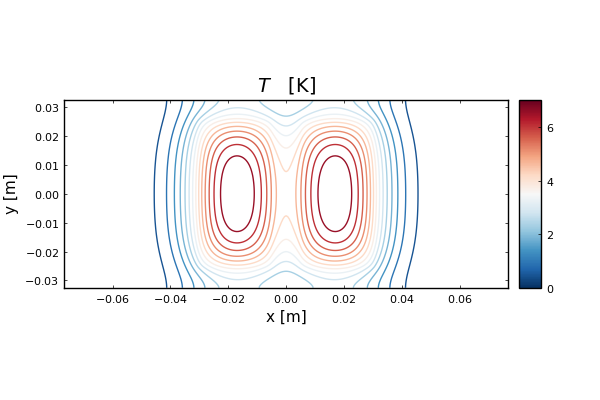

sys:1: UserWarning: The following kwargs were not used by contour: 'label'


In [13]:
plot(Tn,sys.grid,legend=true,color=cgrad(:RdBu,rev=true),line_z=0,xlabel="x [m]",ylabel="y [m]",title=L"T \quad [\mathrm{K}]")

### Plot the temperature along the OHP channel

In [14]:
# plot(sys.qline[1].arccoord,temperature_linesource(integrator),xlabel=L"\xi",ylabel=L"T - T_0")

# OHP inner part

In [15]:
nondi_Q_to_Q = 1.35E+02
t_to_nondi_t = 2.83E-01
function di_T_to_nondi_T(di_T;T0=295.0) 
    
    (di_T+T0)/T0
    
end



di_T_to_nondi_T (generic function with 1 method)

In [16]:
    ω = sqrt(2.45E+03);
    ℘L = 2.05E+05;
    k = 0.106024683

    θinitial=1.0
    θc = 1.0; # useless

    Hwc = 0.0; #not useful later on. H between wall and condenser, 
#     Hₗ   =  1600.0; # liquid wall heat transfer coeffcient
    Hₗ   =  1.01E+03; # liquid wall heat transfer coeffcient for static fluids
    Hδ  = 4.65E+02;


# use a smaller heat  transfer coefficient for the tube because it contacts the plate with one side.
    Hₗ = Hₗ/100 # liquid wall heat transfer coeffcient for static fluids
    Hδ = Hδ/100 # vapor film heat transfer coeffcient * thickness for static fluids

4.65

In [17]:
    d = 6.56e-3 # dimensionless diameter
    L = 34.35  # total length of the pipe when streched to a 1D pipe
    L2D = 1.0 # the actual length of the bended pipe in the real world
    angle = 0*pi/2 # inclination angle 
    ΔTthres = 1.0/295.0; # use a small threshold
    closedornot = true

true

In [18]:
    nucleatenum = 256
    Xstations = sort(rand(nucleatenum).*L);
#     Xstations = LinRange(0.0,L-L/nucleatenum,nucleatenum)
#     boilingΔt = 0.05

In [19]:
tube = Tube(d,L,L2D,angle,ΔTthres,closedornot);

In [20]:
# useless
Xe = map(tuple, [1.0], [3.0])
We = [0.0]
evap = Evaporator(Xe,We);

In [21]:
# useless
Xc = map(tuple, [0.0,3.0], [1.0,4.0])
cond = Condenser(θc,Xc,Hwc);

In [65]:
X0,realratio = randomXp(L,numofslugs=40,chargeratio=0.45)

dXdt0_l = zeros(length(X0))
dXdt0_r = zeros(length(X0))
dXdt0 = map(tuple,dXdt0_l,dXdt0_r)



realratio

0.47678951634143696

In [66]:
N=numpts(ohp)

ρ = 102.593344 # density ratio
Xarrays,θarrays = constructXarrays(X0,N,θinitial,L)
liquids=Liquid(Hₗ,ρ,ω,℘L,X0,dXdt0,Xarrays,θarrays);

In [67]:
# P = [1.0,1.0,1.0,1.0,1.0]; # closed end

γ = 1.4;
# Hδ = 4.64E+02
P = 0*zeros(length(X0)) .+ 1.0;
δ = 0*zeros(length(X0)) .+ 2.78E-02;
# δ = 0*zeros(length(X0)) .+ 2.78E-02 .* 10; # use a random film thickness
vapors=Vapor(γ,Hδ,P,δ);

In [68]:
α = 1.154e-5 # nondimensional thermal diffusivity = (αₐ d^2) / (νₗ height^2)
# Xwallarray,θwallarray = constructXarrays(L,N,θinitial)
Xwallarray,θwallarray = constructXarrays(sys.qline[1].arccoord,L,θinitial)
θwallarray = di_T_to_nondi_T(temperature_linesource(integrator));

wall = Wall(α,Δt,Xstations,Xwallarray,θwallarray);

In [69]:
sys0_nomapping = PHPSystem_nomapping(tube,evap,cond,liquids,vapors,wall);
θ_interp_walltoliquid, θ_interp_liquidtowall, H_interp_liquidtowall, P_interp_liquidtowall = sys_interpolation(sys0_nomapping)
mapping = Mapping(θ_interp_walltoliquid, θ_interp_liquidtowall, H_interp_liquidtowall, P_interp_liquidtowall);

In [70]:
sys0 = PHPSystem(tube,evap,cond,liquids,vapors,wall,mapping);

### construct state vector U

In [71]:
Lvaporplug = XptoLvaporplug(X0,sys0.tube.L,sys0.tube.closedornot)
M = nondi_PtoD(P) .* Lvaporplug
# M = P.^(1/γ).* Lvaporplug


u=[XMδtovec(X0,dXdt0,M,δ); liquidθtovec(sys0.liquid.θarrays)];

In [72]:
cb_boiling =  DiscreteCallback(boiling_condition,boiling_affect!)
# cb_boiling =  PeriodicCallback(boiling_affect!,0.01*t_to_nondi_t)
cb_merging =  DiscreteCallback(merging_condition,merging_affect!)

cbst = CallbackSet(cb_boiling,cb_merging);

# combine inner tube and plate together

In [73]:
tspan = (0.0, 300.0);
dt_record = tspan[2] /150;

tstep=2e-3

N_iter = 1
# tstep_plate = tstep/N_iter
# dt_record = tstep

1

In [74]:
u0 = newstate(sys)
integrator_plate = init(u0,tspan,sys)
Tplate = temperature(integrator_plate);

In [75]:
p = sys0
u=[XMδtovec(X0,dXdt0,M,δ); liquidθtovec(sys0.liquid.θarrays)];
prob = ODEProblem(ODE_innertube, u, tspan, p)
integrator_tube = init(prob, RK4(),save_everystep=false, dt=tstep*t_to_nondi_t, callback=cbst);

In [76]:
plate_hist = []
tube_hist  = []

currentsys = integrator_tube.p
currentsys = getcurrentsys(integrator_tube.u,currentsys);

In [77]:
# integrator_plate = plate_hist[end-3]
# integrator_tube = tube_hist[end-3]

# currentsys = integrator_tube.p
# currentsys = getcurrentsys(integrator_tube.u,currentsys);

# tspan = (integrator_plate.t, integrator_plate.t + 1.0);
# dt_record = 0.01

In [78]:
# tspan = (integrator_plate.t, integrator_plate.t + 0.2);
# dt_record = tstep

In [79]:

@time for t in tspan[1]:tstep:tspan[2]
    

#   for j in 1:N_iter
        currentsys.wall.θarray = di_T_to_nondi_T(temperature_linesource(integrator_plate))
        currentsys = getcurrentsys(integrator_tube.u,currentsys)


        nondi_qtmp = sys_to_heatflux(currentsys)
        qtmp = nondi_Q_to_Q*nondi_qtmp
        set_linesource_strength!(sys,qtmp)


        Tplate = ADI_timemarching!(Tplate,sys,tstep)
#     end
    integrator_plate.t += tstep
    
    # reinitialize the integrator_tube to avoid some mysterious problems
    prob = ODEProblem(ODE_innertube, deepcopy(integrator_tube.u), (integrator_plate.t*t_to_nondi_t-tstep*t_to_nondi_t,integrator_plate.t*t_to_nondi_t), currentsys)
    integrator_tube = init(prob, RK4(), callback=cbst, dt=tstep*t_to_nondi_t);
#     step!(integrator_tube);
    step!(integrator_tube,tstep*t_to_nondi_t,true);

    if (mod(integrator_plate.t,dt_record) < 1e-6) || (mod(-integrator_plate.t,dt_record) < 1e-6)
        push!(plate_hist,deepcopy(integrator_plate)); 
        push!(tube_hist,deepcopy(integrator_tube));
        println(integrator_plate.t)
    end
    
end

Boiled! at 33.63050881314602 on 0.7000000000000005
2.0000000000000013
3.999999999999781
5.999999999999561
7.999999999999341
10.000000000000009
12.000000000000677
14.000000000001345
16.00000000000201
18.000000000000902
merged!
19.999999999999794
merged!
21.999999999998685
23.999999999997577
25.99999999999647
27.99999999999536
29.99999999999425
31.999999999993143
33.99999999999559
merged!
35.99999999999803
38.000000000000476
40.00000000000292
42.000000000005365
44.00000000000781
46.00000000001025
48.0000000000127
50.00000000001514
52.000000000017586
54.00000000002003
56.000000000022474
58.00000000002492
60.00000000002736
62.00000000002981
Boiled! at 33.43673198641031 on 62.70000000003066
64.00000000003224
66.00000000002758
Boiled! at 32.57979448642882 on 67.20000000002479
68.00000000002292
Boiled! at 33.43673198641031 on 69.40000000001966
70.00000000001826
72.0000000000136
Boiled! at 32.57979448642882 on 72.20000000001313
74.00000000000894
76.00000000000428
Boiled! at 33.449208216700775 

In [80]:
        push!(plate_hist,deepcopy(integrator_plate)); 
        push!(tube_hist,deepcopy(integrator_tube));
        println(integrator_plate.t)

300.00200000070436


In [81]:
sysfinal = []
for i = 1:length(tube_hist)
    push!(sysfinal, deepcopy(getcurrentsys(tube_hist[i].u,tube_hist[i].p)))
end

In [82]:
# plot(ohp,fillalpha=0,line_z=temperature_linesource(integrator_plate))

In [83]:
maximum(temperature(plate_hist[end])[:])

11.361903887213913

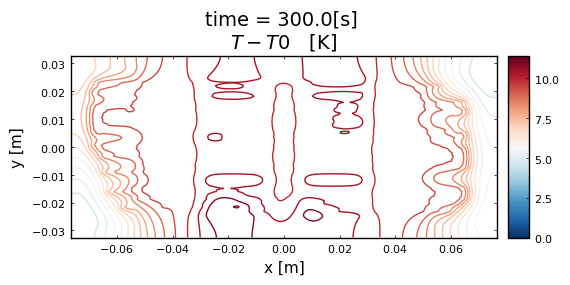

┌ Info: Saved animation to 
│   fn = C:\Users\liyux\Documents\GitHub\ComputationalHeatTransfer.jl\src\tmp.gif
└ @ Plots C:\Users\liyux\.julia\packages\Plots\FKcum\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\liyux\\Documents\\GitHub\\ComputationalHeatTransfer.jl\\src\\tmp.gif")
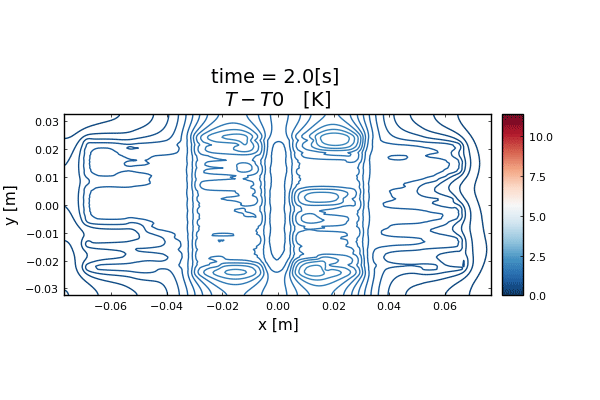

In [84]:
Tmax = maximum(temperature(plate_hist[end-1])[:])
Tmin = 0.0
@gif for i = 1:1:length(plate_hist)
# @gif     for i = 1:1:1  
    
plot(temperature(plate_hist[i]),sys.grid,legend=true,color=cgrad(:RdBu,rev=true),clim=(Tmin,Tmax),line_z=0,xlabel="x [m]",ylabel="y [m]",title=string("time = ", round(plate_hist[i].t, digits=2), "[s] \n",  L"T - T0 \quad [\mathrm{K}]"))
end

In [85]:
minimum(temperature(plate_hist[end]))

4.048858596905826

In [86]:
length(plate_hist)

151

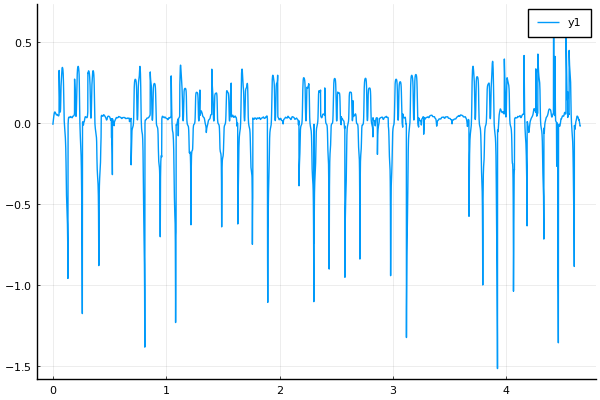

In [87]:
plot(sys.qline[1].arccoord,sys_to_heatflux(sysfinal[end]))

In [88]:
# @gif for i=1:1:1
#     Htmp = sys_to_Harray(sysfinal[i])
#     plot(ohp,fillalpha=0,linecolor=cgrad([:gold, :blue],rev=true),line_z=Htmp,xlabel="x ",ylabel="y ",border=:none,axis=nothing)
# end

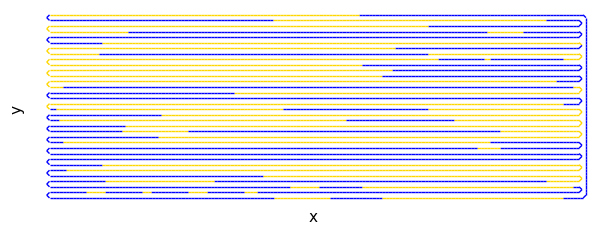

┌ Info: Saved animation to 
│   fn = C:\Users\liyux\Documents\GitHub\ComputationalHeatTransfer.jl\src\tmp.gif
└ @ Plots C:\Users\liyux\.julia\packages\Plots\FKcum\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\liyux\\Documents\\GitHub\\ComputationalHeatTransfer.jl\\src\\tmp.gif")
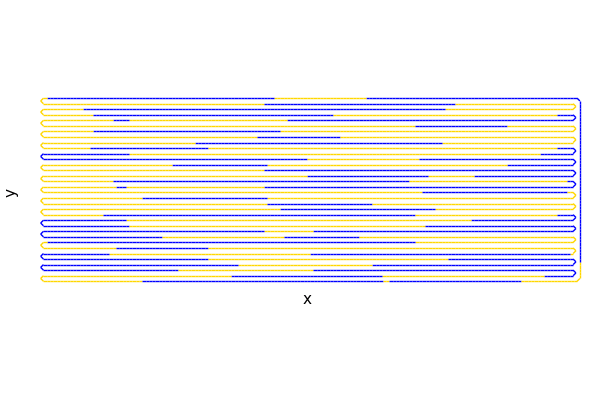

In [89]:
@gif for i=1:5:length(sysfinal)
    Htmp = sys_to_Harray(sysfinal[i])
    plot(ohp,fillalpha=0,linecolor=cgrad([:gold, :blue],rev=true),line_z=Htmp,xlabel="x ",ylabel="y ",border=:none,axis=nothing)
end

# plot the OHP

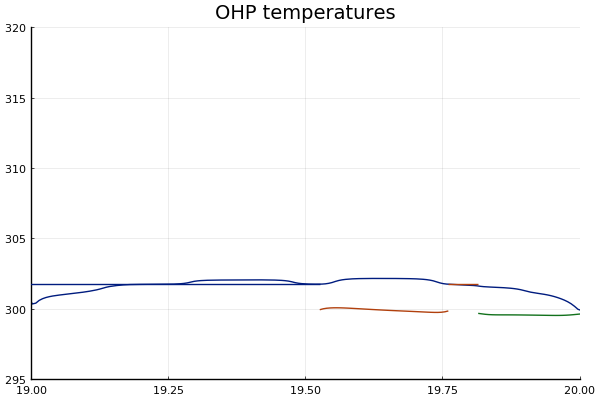

In [90]:
plot(sysfinal[60],xlim=(19.0,20.0),ylim=(295.0,320.0))

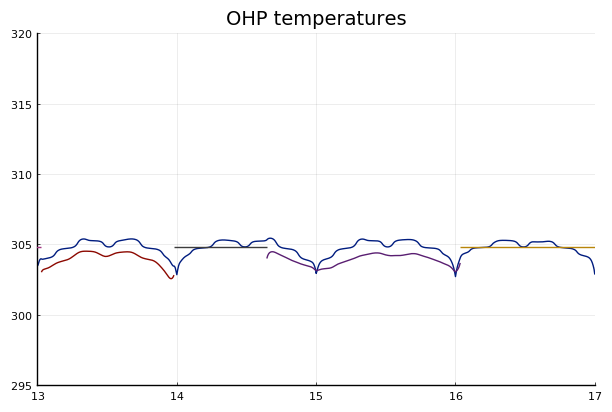

┌ Info: Saved animation to 
│   fn = C:\Users\liyux\Documents\GitHub\ComputationalHeatTransfer.jl\src\tmp.gif
└ @ Plots C:\Users\liyux\.julia\packages\Plots\FKcum\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\liyux\\Documents\\GitHub\\ComputationalHeatTransfer.jl\\src\\tmp.gif")
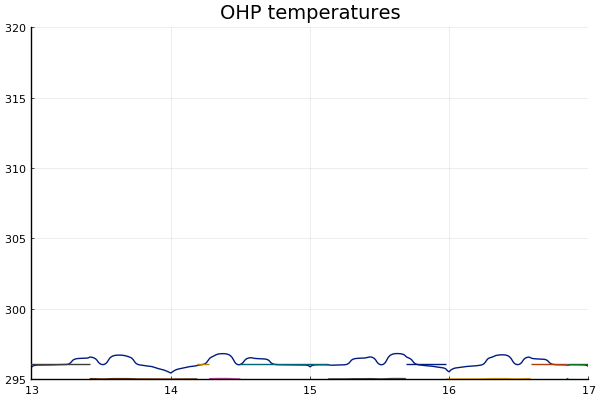

In [91]:
@gif for ii=1:length(sysfinal)
     plot(sysfinal[ii],plottype="T",xlim=(13.0,17.0),ylim=(295.0,320.0))
end

In [92]:
sysfinal[end].mapping.H_interp_liquidtowall[8.5:0.01:8.7]

21-element Array{Float64,1}:
 167.26618705035975
 167.26618705035972
 167.26618705035978
 167.26618705035975
 167.26618705035975
 167.26618705035975
 167.26618705035975
 167.26618705035975
 167.26618705035975
 167.26618705035975
 167.26618705035975
 167.26618705035975
 167.26618705035975
 167.26618705035975
 167.26618705035975
 167.26618705035975
 167.26618705035975
 167.26618705035975
 167.26618705035975
 167.26618705035975
 167.26618705035975

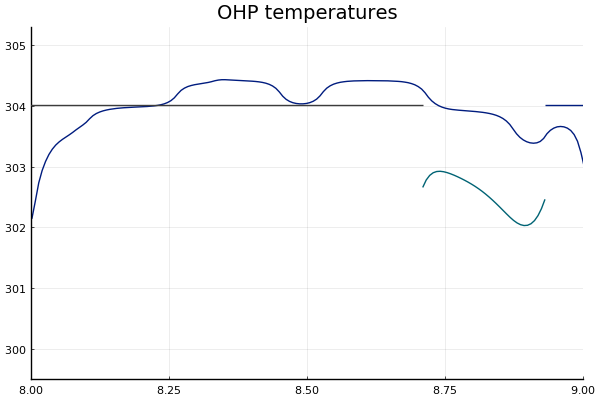

In [93]:
plot(sysfinal[end-30],plottype="T",xlim=(8.0,9.0))

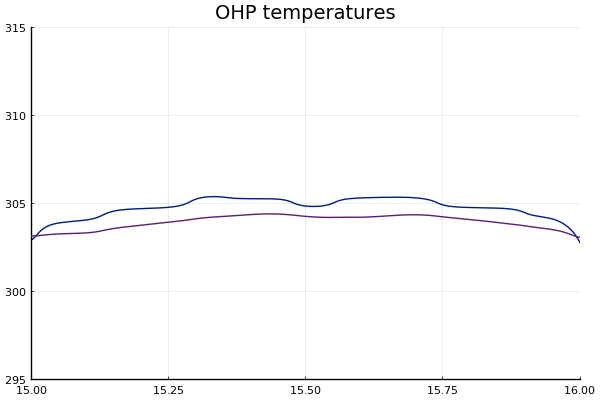

In [94]:
plot(sysfinal[end-1],plottype="T",xlim=(15.0,16.0),ylim=(295.0,315.0))

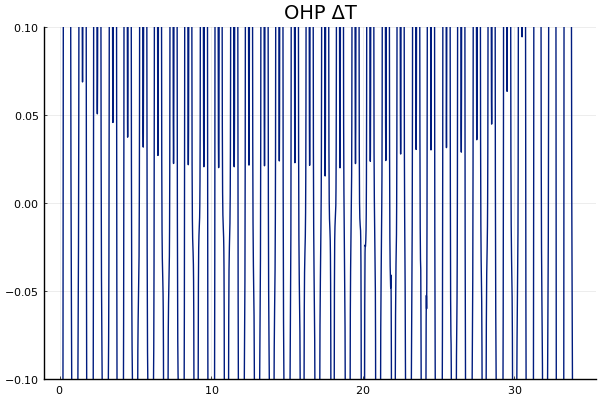

In [95]:
plot(sysfinal[end],plottype="ΔT",ylim=(-0.1,0.1))

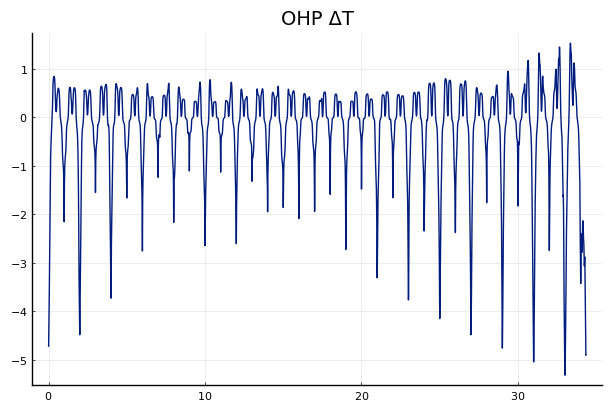

┌ Info: Saved animation to 
│   fn = C:\Users\liyux\Documents\GitHub\ComputationalHeatTransfer.jl\src\tmp.gif
└ @ Plots C:\Users\liyux\.julia\packages\Plots\FKcum\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\liyux\\Documents\\GitHub\\ComputationalHeatTransfer.jl\\src\\tmp.gif")
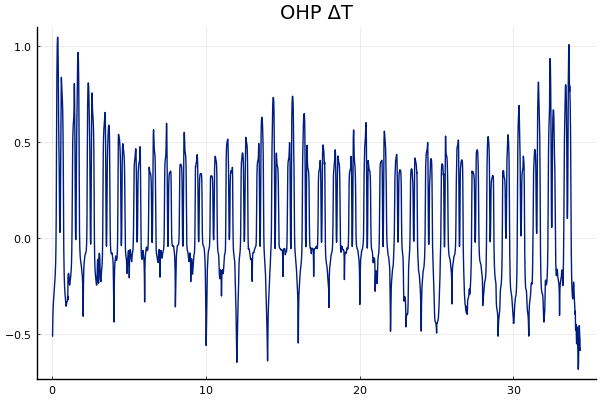

In [96]:
@gif for ii=1:length(sysfinal)
    plot(sysfinal[ii],plottype="ΔT")
end

In [97]:
# plate_hist, integrator_plate = load("plate_OHP_boiling.jld2", "plate_hist",  "integrator_plate")

In [98]:
# tube_hist, integrator_tube = load("tube_OHP_boiling.jld2", "tube_hist",  "integrator_tube")

In [99]:
sysfinal

151-element Array{Any,1}:
 PHPSystem(Tube(0.00656, 34.35, 1.0, 0.0, 0.003389830508474576, true), Evaporator([(1.0, 3.0)], [0.0]), Condenser(1.0, [(0.0, 1.0), (3.0, 4.0)], 0.0), Liquid(10.1, 102.593344, 49.49747468305833, 205000.0, [(9.962655489647238, 10.065948019277409), (10.834399421967024, 11.498427369279506), (11.702950410239932, 12.124938362910319), (12.574902228927867, 12.754422742827801), (13.418987080148781, 14.19123330680921), (14.276189373514658, 14.50106995465902), (15.131405530945374, 15.6891892228864), (15.979719684735608, 16.585233220048668), (16.842625536716575, 16.856421766799304), (17.712718419606844, 17.981356387839423)  …  (1.4152125936608848, 1.7734633669224658), (2.2449932557294843, 2.915872096531652), (3.093030135328483, 3.5413250826854106), (3.963494241404724, 4.536405273166162), (4.83484770298537, 4.863827192408954), (5.700230500214123, 5.867170808246006), (6.552782246309981, 6.902874751788531), (7.404831212317942, 7.559554048565116), (8.251922674507748, 8.71107

In [100]:
save("plate_OHP_mediumlowH.jld2", "plate_hist", plate_hist, "integrator_plate", integrator_plate)

In [101]:
save("tube_OHP_mediumlowH.jld2", "tube_hist", tube_hist, "integrator_tube",integrator_tube)

In [102]:
inch = 2.54e-2;

# x = [-2.7inch,0.0,2.7inch];
# y = [0.0,0.0,0.0];

x = [0.0]
y = [0.0]

X =  VectorData(x,y);

In [103]:
H = Regularize(X,cellsize(sys),I0=origin(sys.grid))
g = ScalarData(X);

In [104]:
ghist = []
thist = []
for i = 1:length(plate_hist)
    H(g,temperature(plate_hist[i]))
    append!(ghist,deepcopy(g))
    append!(thist,plate_hist[i].t)
end

In [105]:
RTDx,RTDy = load("RTD4.jld2","RTDx","RTDy")

([10.89866157, 14.34034417, 21.22370937, 37.8585086, 64.24474187, 96.36711281, 125.6214149, 152.581262, 182.4091778, 211.0898662, 247.2275335, 275.334608], [16.58279415, 20.15358253, 23.16569499, 25.33894001, 26.617514, 27.22537814, 27.38734721, 27.60554664, 27.82321258, 27.81787763, 28.03436988, 27.97333806])

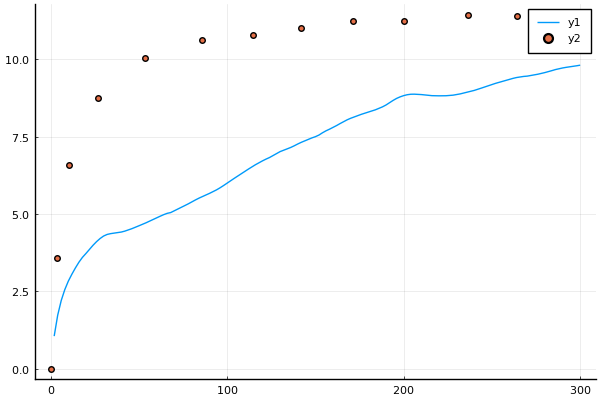

In [106]:
plot(thist,ghist)
scatter!(RTDx .- RTDx[1],RTDy .- RTDy[1])

In [64]:
rand(10)

10-element Array{Float64,1}:
 0.8362951234940623
 0.4354952586745815
 0.039411736504334716
 0.587410620725894
 0.09939646698458948
 0.527935836153788
 0.3261697963597303
 0.7881403705636565
 0.5628634117456675
 0.5751459396946108